In [1]:
import pandas as pd
import numpy as np
from top2vec import Top2Vec
import time

/share/apps/rc/software/Anaconda3/2020.07/envs/deepNLP2020/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


In [2]:
import inspect

print (inspect.getmodule(Top2Vec).__file__)

/home/abulut/.local/lib/python3.7/site-packages/top2vec/Top2Vec.py


In [3]:
%%time
# Deleted 2332 rows bc of Publication Date format was not meaningful, 4 rows 
# deleted bc the date was early 2019 which is not the focus
df=pd.read_excel('AbstractsCleanUpdatednew.xlsx', usecols=['Publication Date','Title','Abstract'])
# 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62454 entries, 0 to 62453
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Publication Date  62454 non-null  datetime64[ns]
 1   Title             62454 non-null  object        
 2   Abstract          62454 non-null  object        
dtypes: datetime64[ns](1), object(2)
memory usage: 1.4+ MB
CPU times: user 16.2 s, sys: 300 ms, total: 16.5 s
Wall time: 16.8 s


In [4]:
df1=df[(df['Publication Date']<'2020-02-01')]
df2=df[(df['Publication Date']>'2020-01-31') & (df['Publication Date']<'2020-03-01')].dropna()
df3=df[(df['Publication Date']>'2020-02-29') & (df['Publication Date']<'2020-04-01')].dropna()
df4=df[(df['Publication Date']>'2020-03-31') & (df['Publication Date']<'2020-05-01')].dropna()
df5=df[(df['Publication Date']>'2020-04-30') & (df['Publication Date']<'2020-06-01')].dropna()
df6=df[(df['Publication Date']>'2020-05-31') & (df['Publication Date']<'2020-07-01')].dropna()
df7=df[(df['Publication Date']>'2020-06-30') & (df['Publication Date']<'2020-08-01')].dropna()
df8=df[(df['Publication Date']>'2020-07-31') & (df['Publication Date']<'2020-09-01')].dropna()
df9=df[(df['Publication Date']>'2020-08-31') & (df['Publication Date']<'2020-10-01')].dropna()
df10=df[(df['Publication Date']>'2020-09-30') & (df['Publication Date']<'2020-11-01')].dropna()
df11=df[(df['Publication Date']>'2020-10-31')].dropna()

In [5]:
print(df1.shape,df2.shape, df3.shape, df4.shape, df5.shape, df6.shape, df7.shape,
      df8.shape,df9.shape, df10.shape, df11.shape,   )

(51, 3) (625, 3) (1889, 3) (5352, 3) (7692, 3) (7887, 3) (9013, 3) (9972, 3) (8611, 3) (9112, 3) (2250, 3)


## JAN

In [6]:
# %%time
# abstract = df1.Abstract.to_list()

# jan = Top2Vec(documents=abstract, speed="learn", workers=8, min_count=10)

In [7]:
# num_top = jan.get_num_topics()
# print(num_top)
# top_score = jan.topic_word_scores.sum()/(num_top*50)
# top_score

In [8]:

# jan.generate_topic_wordcloud(0)

## FEBURARY

In [9]:
%%time
abstract = df2.Abstract.to_list()

feb = Top2Vec(documents=abstract, speed="learn", workers=8, min_count=25)

2020-11-28 03:56:59,194 - top2vec - INFO - Ayse Pre-processing documents for training
2020-11-28 03:56:59,783 - top2vec - INFO - Creating joint document/word embedding
2020-11-28 03:57:06,875 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-28 03:57:22,911 - top2vec - INFO - Finding dense areas of documents
2020-11-28 03:57:22,943 - top2vec - INFO - Finding topics


CPU times: user 48.2 s, sys: 2.53 s, total: 50.7 s
Wall time: 23.8 s


In [10]:
num_top = feb.get_num_topics()
print(num_top)
top_score = feb.topic_word_scores.sum()/(num_top*50)
top_score

3


0.7682582600911458

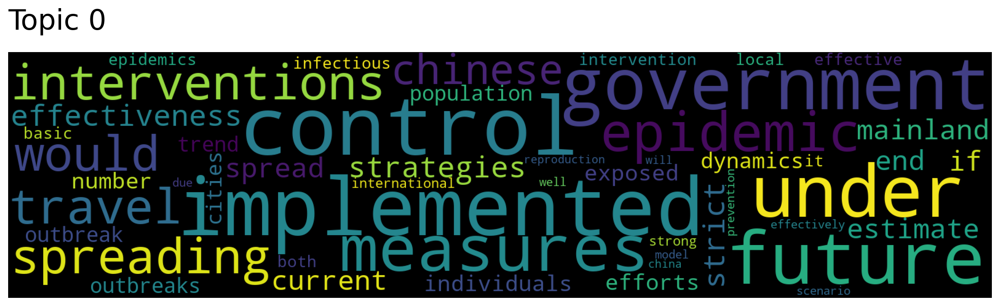

In [11]:

feb.generate_topic_wordcloud(0)

0.7321941375732421


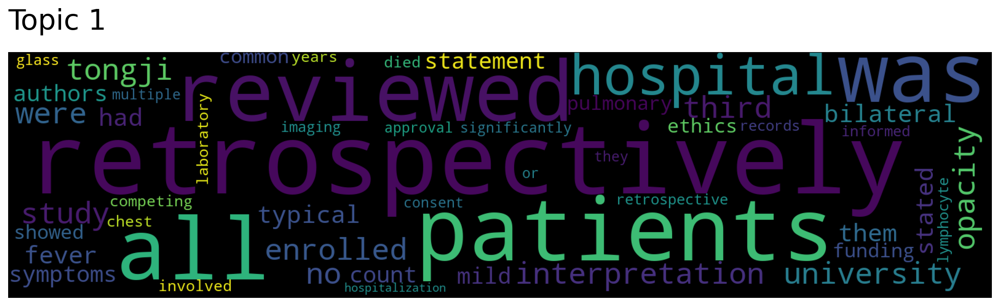

In [50]:
feb.hierarchical_topic_reduction(1)
w,s,n = feb.get_topics(reduced=True)
print(s.sum()/(50))
feb.generate_topic_wordcloud(1, reduced=False)

## MARCH

In [13]:
%%time
# Convert to a list for MARCH
abstract = df3.Abstract.to_list()

march = Top2Vec(documents=abstract, speed="learn", workers=8, min_count=30)

2020-11-28 03:57:26,756 - top2vec - INFO - Ayse Pre-processing documents for training
2020-11-28 03:57:28,226 - top2vec - INFO - Creating joint document/word embedding
2020-11-28 03:57:58,710 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-28 03:58:10,679 - top2vec - INFO - Finding dense areas of documents
2020-11-28 03:58:10,751 - top2vec - INFO - Finding topics


CPU times: user 3min 49s, sys: 3.48 s, total: 3min 52s
Wall time: 44 s


In [14]:
num_top = march.get_num_topics()
print(num_top)
top_score = march.topic_word_scores.sum()/(num_top*50)
top_score

2


0.43370731353759767

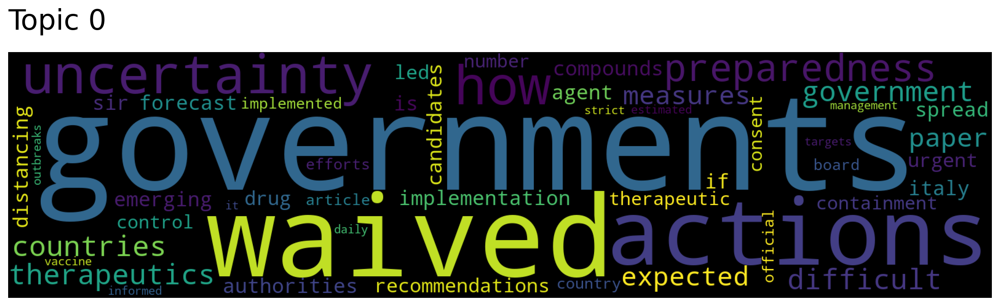

In [15]:
march.generate_topic_wordcloud(0)

0.40656223297119143


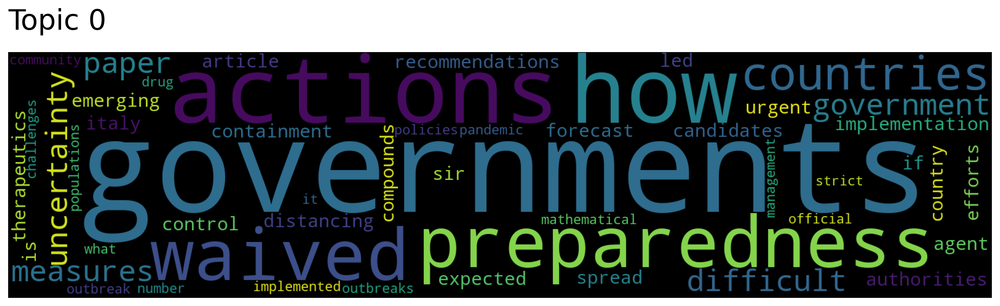

In [49]:
march.hierarchical_topic_reduction(1)
w,s,n = march.get_topics(reduced=True)
print(s.sum()/(50))
march.generate_topic_wordcloud(0, reduced=True)

## APRIL

In [17]:
%%time
# Convert to a list for APRIL
abstract = df4.Abstract.to_list()

april = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=30)

2020-11-28 03:58:14,463 - top2vec - INFO - Ayse Pre-processing documents for training
2020-11-28 03:58:18,342 - top2vec - INFO - Creating joint document/word embedding
2020-11-28 04:00:27,554 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-28 04:01:05,535 - top2vec - INFO - Finding dense areas of documents
2020-11-28 04:01:05,775 - top2vec - INFO - Finding topics


CPU times: user 8min 40s, sys: 14.4 s, total: 8min 54s
Wall time: 2min 51s


In [18]:
# min_count=50
num_top = april.get_num_topics()
print(num_top)
top_score = april.topic_word_scores.sum()/(num_top*50)
top_score

29


0.37503005455280175

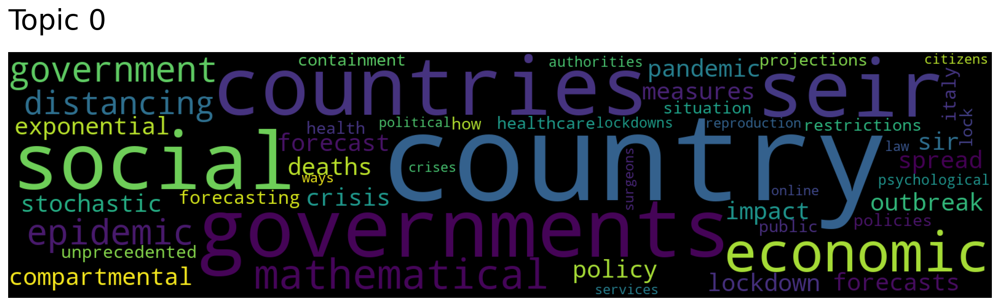

In [19]:
april.generate_topic_wordcloud(0)

0.2455603790283203


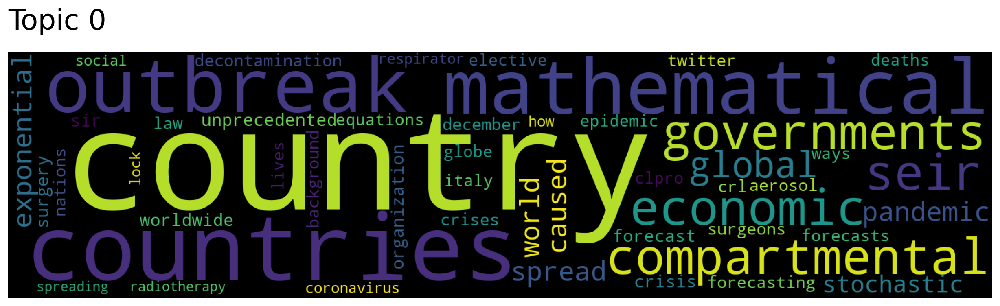

In [20]:
april.hierarchical_topic_reduction(1)
w,s,n = april.get_topics(reduced=True)
print(s.sum()/(50))
april.generate_topic_wordcloud(0, reduced=True)

## MAY

In [34]:
%%time
# Convert to a list for MAY
abstract = df5.Abstract.to_list()

may = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=20)

2020-11-29 16:20:42,540 - top2vec - INFO - UMAP 30 Pre-processing documents for training
2020-11-29 16:20:46,405 - top2vec - INFO - Creating joint document/word embedding
2020-11-29 16:23:52,460 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-29 16:24:05,041 - top2vec - INFO - Finding dense areas of documents
2020-11-29 16:24:05,278 - top2vec - INFO - Finding topics


CPU times: user 12min 37s, sys: 5.29 s, total: 12min 43s
Wall time: 3min 22s


In [35]:
num_top = may.get_num_topics()
print(num_top)
top_score = may.topic_word_scores.sum()/(num_top*50)
top_score

32


0.4081635284423828

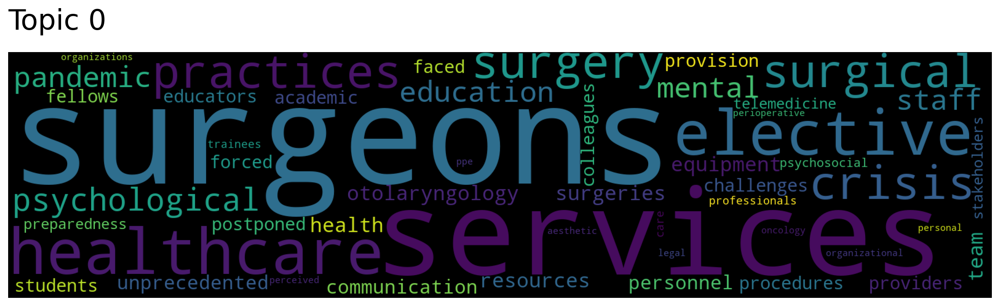

In [37]:
may.generate_topic_wordcloud(0)

0.23247533798217773


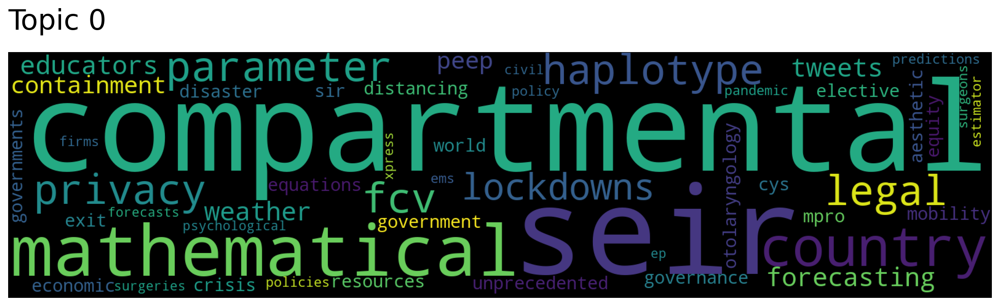

In [38]:
may.hierarchical_topic_reduction(1)
w,s,n = may.get_topics(reduced=True)
print(s.sum()/(50))
may.generate_topic_wordcloud(0, reduced=True)

In [40]:
may.get_topics(reduced=True)

(array([['compartmental', 'seir', 'mathematical', 'country', 'parameter',
         'fcv', 'haplotype', 'legal', 'privacy', 'lockdowns',
         'forecasting', 'tweets', 'educators', 'weather', 'containment',
         'peep', 'unprecedented', 'distancing', 'governance', 'aesthetic',
         'governments', 'mpro', 'otolaryngology', 'exit', 'crisis',
         'world', 'cys', 'sir', 'elective', 'equations', 'resources',
         'government', 'economic', 'mobility', 'equity', 'disaster',
         'predictions', 'policies', 'pandemic', 'firms', 'surgeons',
         'estimator', 'ems', 'policy', 'psychological', 'ep', 'surgeries',
         'xpress', 'forecasts', 'civil']], dtype='<U14'),
 array([[0.27386802, 0.26551133, 0.2652838 , 0.2625474 , 0.26162058,
         0.2514108 , 0.25035232, 0.24663943, 0.2463381 , 0.24489674,
         0.24246886, 0.24246302, 0.24078602, 0.23768154, 0.23698543,
         0.23627916, 0.23593268, 0.23445866, 0.23347698, 0.23266506,
         0.23193043, 0.23143893

## JUNE

In [7]:
%%time
# Convert to a list for MAY
abstract = df6.Abstract.to_list()

june = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=30)

2020-11-29 18:19:18,135 - top2vec - INFO - UMAP 35 Pre-processing documents for training
2020-11-29 18:19:22,741 - top2vec - INFO - Creating joint document/word embedding
2020-11-29 18:22:48,177 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-29 18:23:06,842 - top2vec - INFO - Finding dense areas of documents
2020-11-29 18:23:07,104 - top2vec - INFO - Finding topics


CPU times: user 14min 20s, sys: 5.64 s, total: 14min 25s
Wall time: 3min 49s


In [8]:
num_top = june.get_num_topics()
print(num_top)
top_score = june.topic_word_scores.sum()/(num_top*50)
top_score

28


0.3929530988420759

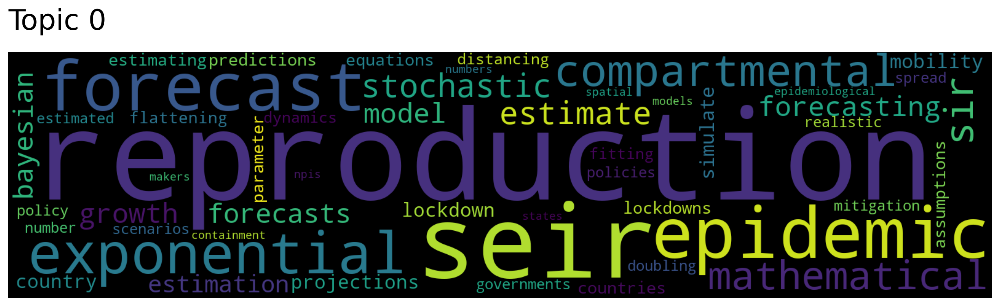

In [9]:
june.generate_topic_wordcloud(0)

0.23783008575439454


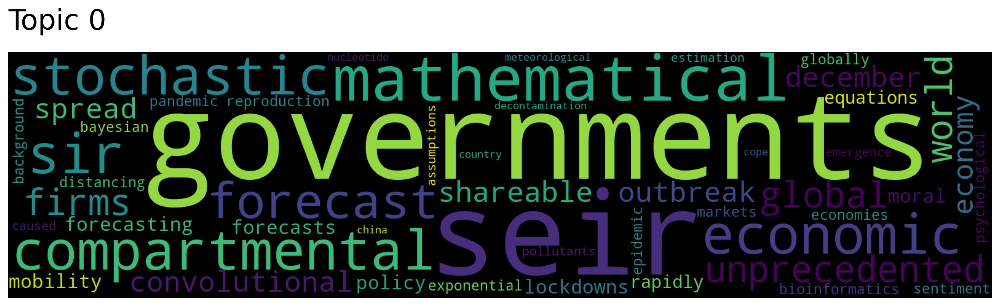

In [10]:
june.hierarchical_topic_reduction(1)
w,s,n = june.get_topics(reduced=True)
print(s.sum()/(50))
june.generate_topic_wordcloud(0, reduced=True)

## JULY

In [11]:
%%time
# Convert to a list for MAY
abstract = df7.Abstract.to_list()

july = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=40)

2020-11-29 18:42:25,669 - top2vec - INFO - UMAP 35 Pre-processing documents for training
2020-11-29 18:42:34,592 - top2vec - INFO - Creating joint document/word embedding
2020-11-29 18:50:30,537 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-29 18:50:52,308 - top2vec - INFO - Finding dense areas of documents
2020-11-29 18:50:52,619 - top2vec - INFO - Finding topics


CPU times: user 32min 16s, sys: 15.2 s, total: 32min 32s
Wall time: 8min 27s


In [12]:
num_top = july.get_num_topics()
print(num_top)
top_score = july.topic_word_scores.sum()/(num_top*50)
top_score

2


0.37427406311035155

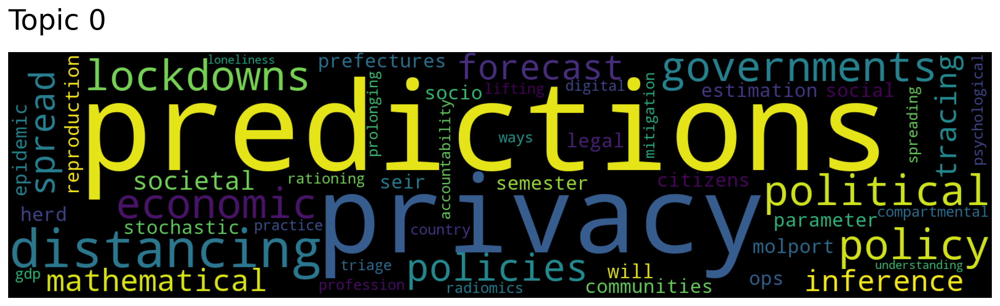

In [13]:
july.generate_topic_wordcloud(0)

0.2592436218261719


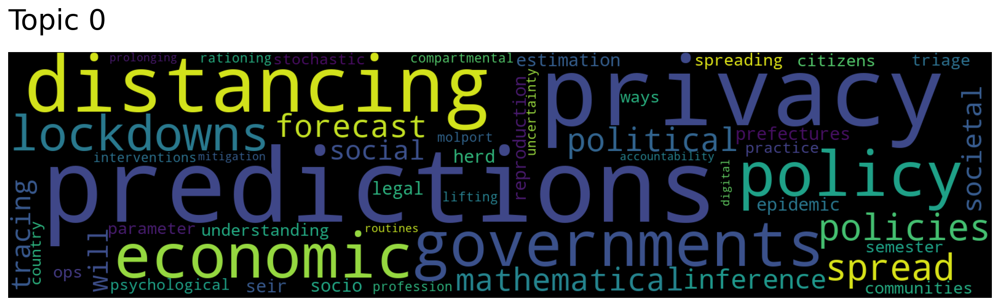

In [14]:
july.hierarchical_topic_reduction(1)
w,s,n = july.get_topics(reduced=True)
print(s.sum()/(50))
july.generate_topic_wordcloud(0, reduced=True)

## AUGUST

In [15]:
%%time
# Convert to a list for MAY
abstract = df8.Abstract.to_list()

aug = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=30)

2020-11-29 18:57:48,115 - top2vec - INFO - UMAP 35 Pre-processing documents for training
2020-11-29 18:57:57,748 - top2vec - INFO - Creating joint document/word embedding
2020-11-29 19:07:19,491 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-29 19:07:37,129 - top2vec - INFO - Finding dense areas of documents
2020-11-29 19:07:37,469 - top2vec - INFO - Finding topics


CPU times: user 37min 42s, sys: 13.7 s, total: 37min 56s
Wall time: 9min 49s


In [16]:
num_top = aug.get_num_topics()
print(num_top)
top_score = aug.topic_word_scores.sum()/(num_top*50)
top_score

46


0.4262968113111413

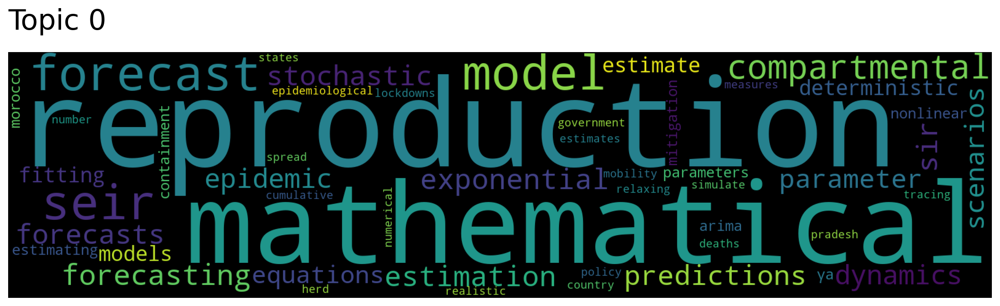

In [17]:
aug.generate_topic_wordcloud(0)

0.27503702163696286


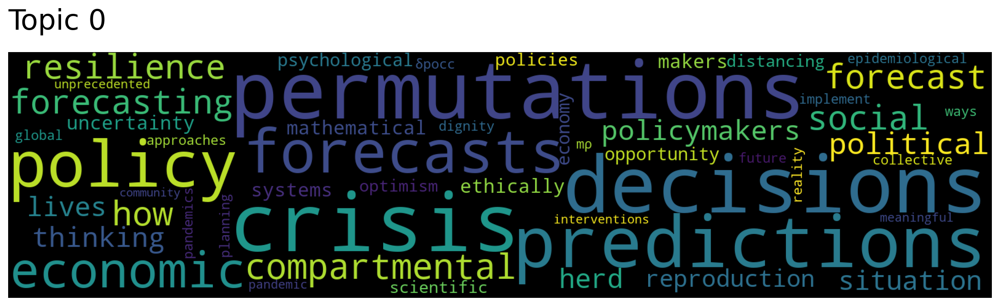

In [18]:
aug.hierarchical_topic_reduction(1)
w,s,n = aug.get_topics(reduced=True)
print(s.sum()/(50))
aug.generate_topic_wordcloud(0, reduced=True)

## SEPTEMBER

In [19]:
%%time
# Convert to a list for MAY
abstract = df9.Abstract.to_list()

sep = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=30)

2020-11-29 19:13:43,317 - top2vec - INFO - UMAP 35 Pre-processing documents for training
2020-11-29 19:13:50,936 - top2vec - INFO - Creating joint document/word embedding
2020-11-29 19:20:29,583 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-29 19:20:44,555 - top2vec - INFO - Finding dense areas of documents
2020-11-29 19:20:44,863 - top2vec - INFO - Finding topics


CPU times: user 26min 49s, sys: 10.6 s, total: 27min
Wall time: 7min 1s


In [20]:
num_top = sep.get_num_topics()
print(num_top)
top_score = sep.topic_word_scores.sum()/(num_top*50)
top_score

31


0.42049095892137095

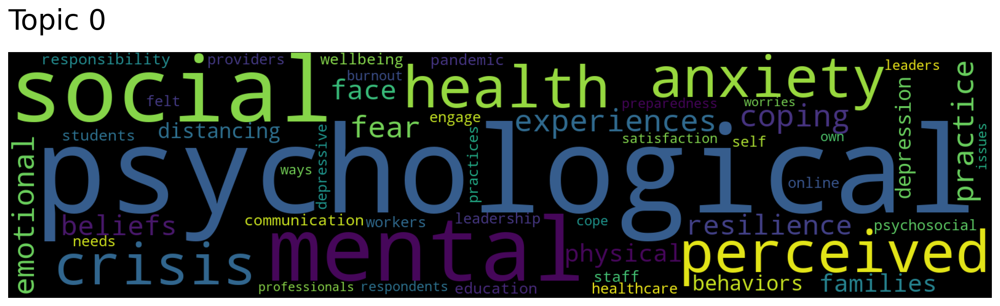

In [21]:
sep.generate_topic_wordcloud(0)

0.2672005844116211


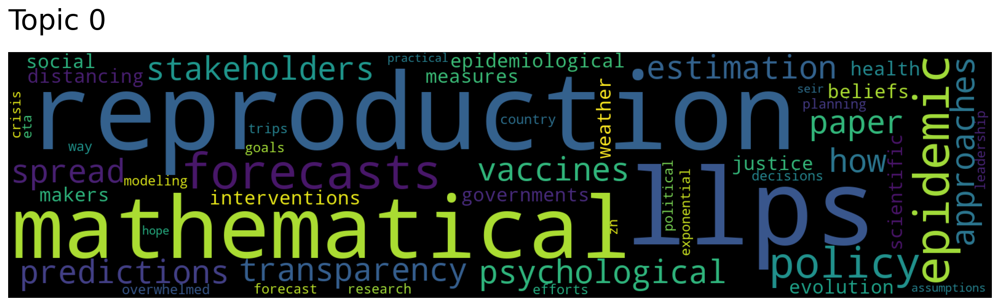

In [37]:
sep.hierarchical_topic_reduction(1)
w,s,n = sep.get_topics(reduced=True)
print(s.sum()/(50))
sep.generate_topic_wordcloud(0, reduced=True)

## OCTOBER

In [23]:
%%time
# Convert to a list for MAY
abstract = df10.Abstract.to_list()

octo = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=30)

2020-11-29 19:22:05,086 - top2vec - INFO - UMAP 35 Pre-processing documents for training
2020-11-29 19:22:12,646 - top2vec - INFO - Creating joint document/word embedding
2020-11-29 19:28:51,475 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-29 19:29:05,970 - top2vec - INFO - Finding dense areas of documents
2020-11-29 19:29:06,288 - top2vec - INFO - Finding topics


CPU times: user 26min 44s, sys: 12.8 s, total: 26min 56s
Wall time: 7min 1s


In [24]:
num_top = octo.get_num_topics()
print(num_top)
top_score = octo.topic_word_scores.sum()/(num_top*50)
top_score

26


0.4373282564603365

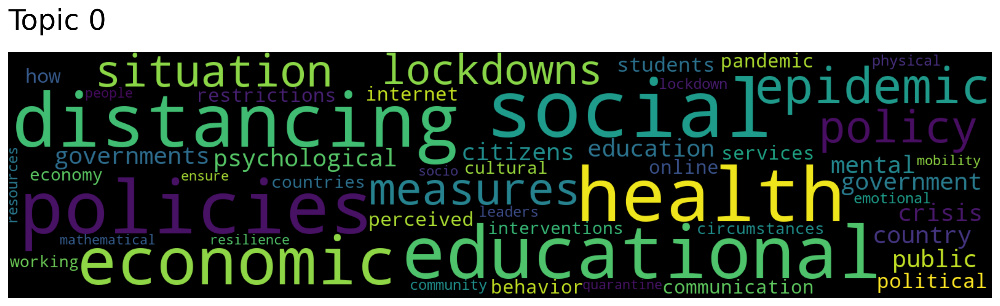

In [25]:
octo.generate_topic_wordcloud(0)

0.26847354888916014


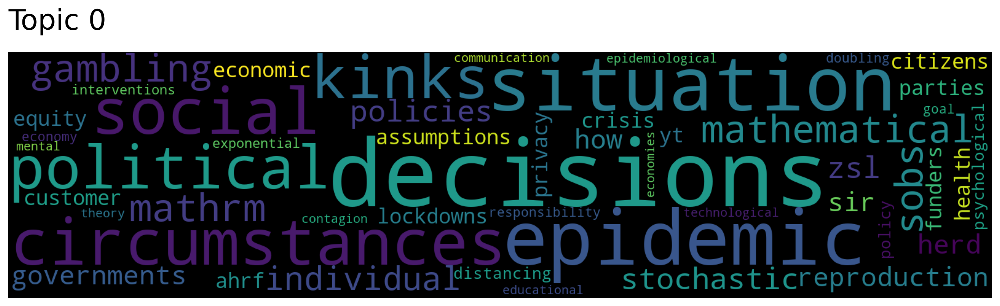

In [26]:
octo.hierarchical_topic_reduction(1)
w,s,n = octo.get_topics(reduced=True)
print(s.sum()/(50))
octo.generate_topic_wordcloud(0, reduced=True)

In [27]:
octo.get_topics(reduced=True)

(array([['decisions', 'epidemic', 'situation', 'circumstances', 'social',
         'political', 'kinks', 'gambling', 'mathematical', 'sobs',
         'mathrm', 'individual', 'policies', 'zsl', 'stochastic',
         'governments', 'sir', 'herd', 'reproduction', 'how',
         'assumptions', 'lockdowns', 'economic', 'ahrf', 'funders',
         'parties', 'yt', 'health', 'crisis', 'equity', 'privacy',
         'customer', 'citizens', 'distancing', 'psychological', 'policy',
         'exponential', 'interventions', 'responsibility', 'doubling',
         'economy', 'goal', 'epidemiological', 'contagion',
         'technological', 'communication', 'economies', 'educational',
         'mental', 'theory']], dtype='<U15'),
 array([[0.30015504, 0.29961103, 0.2962209 , 0.29250103, 0.29027712,
         0.29015595, 0.28633547, 0.28432107, 0.28249997, 0.28049275,
         0.2794387 , 0.277176  , 0.27676636, 0.27572095, 0.274459  ,
         0.27291173, 0.27088422, 0.2707888 , 0.27035835, 0.2690914 

## NOVEMBER

In [28]:
%%time
# Convert to a list for MAY
abstract = df11.Abstract.to_list()

nov = Top2Vec(documents=abstract, speed="learn", workers=4, min_count=30)

2020-11-29 19:30:20,891 - top2vec - INFO - UMAP 35 Pre-processing documents for training
2020-11-29 19:30:22,259 - top2vec - INFO - Creating joint document/word embedding
2020-11-29 19:30:57,173 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-29 19:31:10,977 - top2vec - INFO - Finding dense areas of documents
2020-11-29 19:31:11,038 - top2vec - INFO - Finding topics


CPU times: user 2min 37s, sys: 1.22 s, total: 2min 38s
Wall time: 50.2 s


In [29]:
num_top = nov.get_num_topics()
print(num_top)
top_score = nov.topic_word_scores.sum()/(num_top*50)
top_score

2


0.4056974792480469

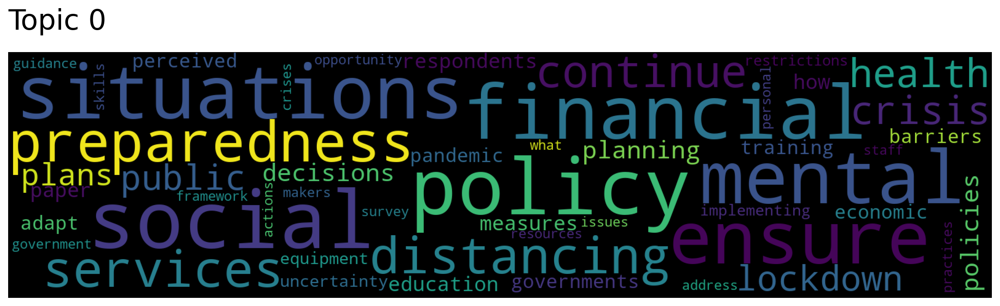

In [30]:
nov.generate_topic_wordcloud(0)

0.3252175521850586


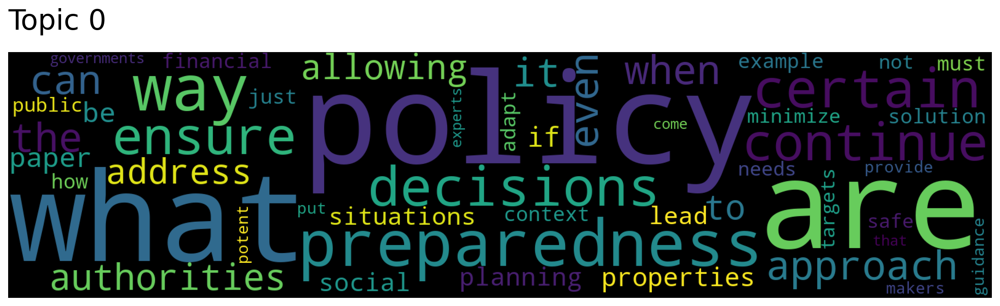

In [31]:
nov.hierarchical_topic_reduction(1)
w,s,n = nov.get_topics(reduced=True)
print(s.sum()/(50))
nov.generate_topic_wordcloud(0, reduced=True)